In [1]:
# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy

# Basic libraries
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# For data processing
from sklearn.model_selection import train_test_split


In [2]:
# from tensorflow.keras.mixed_precision import set_global_policy

# set_global_policy("mixed_float16")

In [3]:
# Set dataset path
BASE_DIR = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset"
IMAGE_DIR = os.path.join(BASE_DIR, "image")
MASK_DIR = os.path.join(BASE_DIR, "mask")

# Initialize lists to store image and mask file paths
image_paths = []
mask_paths = []

# Loop through each tumor class subfolder
for tumor_class in ['0', '1', '2', '3']:
    img_folder = os.path.join(IMAGE_DIR, tumor_class)
    mask_folder = os.path.join(MASK_DIR, tumor_class)

    for img_file in os.listdir(img_folder):
        if img_file.endswith('.jpg'):
            img_path = os.path.join(img_folder, img_file)
            mask_file = img_file.replace('.jpg', '_m.jpg')
            mask_path = os.path.join(mask_folder, mask_file)

            if os.path.exists(mask_path):
                image_paths.append(img_path)
                mask_paths.append(mask_path)

print(f"Total image-mask pairs: {len(image_paths)}")


Total image-mask pairs: 4237


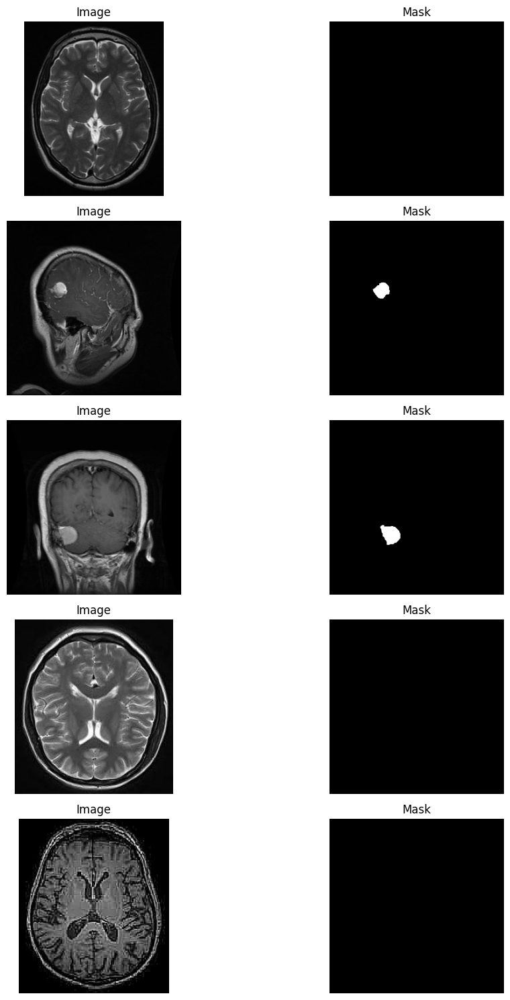

In [4]:
def show_sample_pairs(image_paths, mask_paths, num_samples=5):
    plt.figure(figsize=(12, num_samples * 3))
    for i in range(num_samples):
        index = random.randint(0, len(image_paths) - 1)
        
        # Load image and mask
        image = Image.open(image_paths[index]).convert("RGB")
        mask = Image.open(mask_paths[index]).convert("L")

        # Plot image
        plt.subplot(num_samples, 2, i * 2 + 1)
        plt.imshow(image)
        plt.title("Image")
        plt.axis("off")

        # Plot mask
        plt.subplot(num_samples, 2, i * 2 + 2)
        plt.imshow(mask, cmap="gray")
        plt.title("Mask")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# Show 5 samples
show_sample_pairs(image_paths, mask_paths, num_samples=5)

In [5]:
# Define base paths
base_path = '/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset'
image_dir = os.path.join(base_path, 'image')
mask_dir = os.path.join(base_path, 'mask')


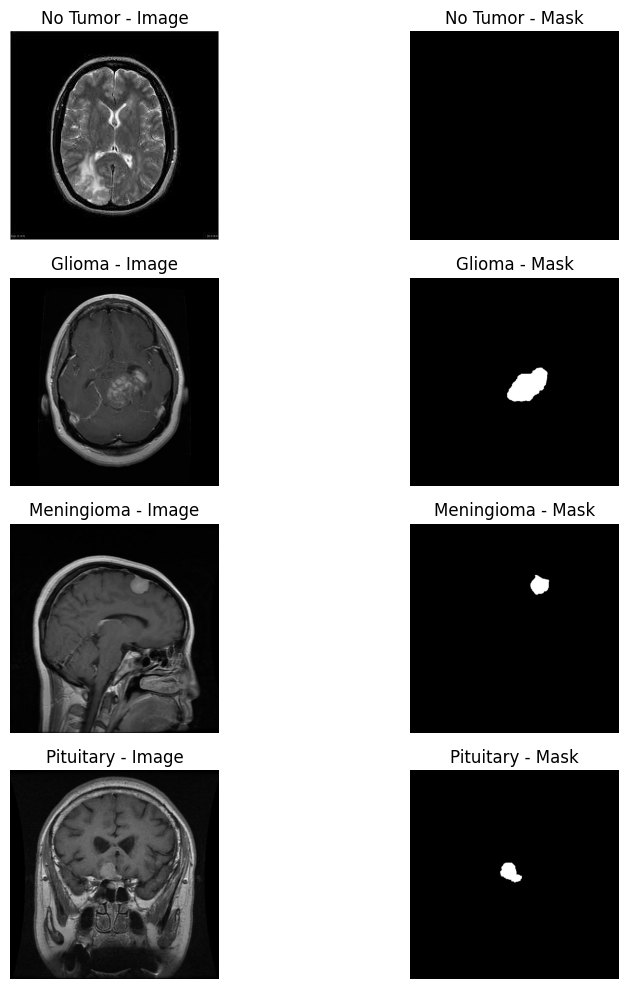

In [6]:
tumor_classes = {
    '0': 'No Tumor',
    '1': 'Glioma',
    '2': 'Meningioma',
    '3': 'Pituitary'
}

def show_classwise_samples(image_dir, mask_dir):
    plt.figure(figsize=(10, 10))

    for i, class_id in enumerate(tumor_classes.keys()):
        # Get image and mask folder for this class
        img_folder = os.path.join(image_dir, class_id)
        mask_folder = os.path.join(mask_dir, class_id)

        # Pick a random image
        img_names = [f for f in os.listdir(img_folder) if f.endswith('.jpg')]
        img_name = random.choice(img_names)
        img_path = os.path.join(img_folder, img_name)
        mask_path = os.path.join(mask_folder, img_name.replace(".jpg", "_m.jpg"))

        # Load image and mask
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        # Plot image
        plt.subplot(4, 2, 2 * i + 1)
        plt.imshow(image)
        plt.title(f"{tumor_classes[class_id]} - Image")
        plt.axis("off")

        # Plot mask
        plt.subplot(4, 2, 2 * i + 2)
        plt.imshow(mask, cmap="gray")
        plt.title(f"{tumor_classes[class_id]} - Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Run the visualization
show_classwise_samples(image_dir, mask_dir)

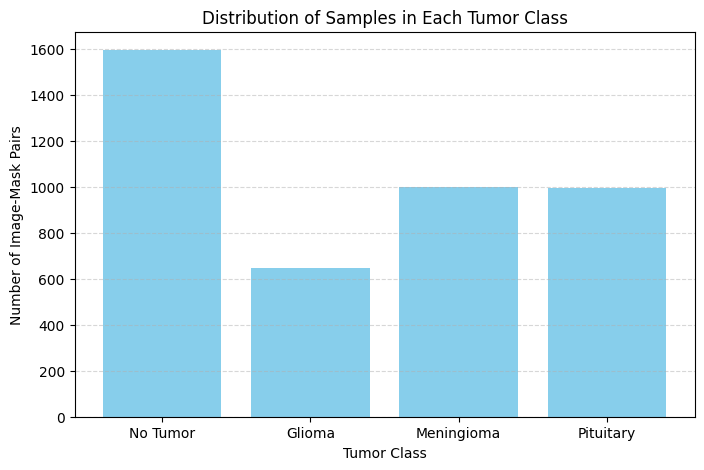

In [7]:
# Classes
classes = ['0', '1', '2', '3']
class_names = {
    '0': 'No Tumor',
    '1': 'Glioma',
    '2': 'Meningioma',
    '3': 'Pituitary'
}

# Count number of images in each class
counts = []
for cls in classes:
    class_image_dir = os.path.join(image_dir, cls)
    num_images = len([file for file in os.listdir(class_image_dir) if file.endswith('.jpg')])
    counts.append(num_images)

# Plot bar graph
plt.figure(figsize=(8, 5))
plt.bar([class_names[c] for c in classes], counts, color='skyblue')
plt.xlabel("Tumor Class")
plt.ylabel("Number of Image-Mask Pairs")
plt.title("Distribution of Samples in Each Tumor Class")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

In [8]:
from glob import glob
from tqdm import tqdm

# Set image dimensions
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 8
SEED = 42


In [9]:
def load_image_mask(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = tf.cast(image, tf.float32) / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_jpeg(mask, channels=1)
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])
    mask = tf.cast(mask, tf.float32) / 255.0

    return image, mask

In [10]:
import glob


image_base_dir = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image"
mask_base_dir = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/mask"

# Define classes
tumor_classes = ["0", "1", "2", "3"]

# Lists to store valid pairs
image_paths = []
mask_paths = []

for cls in tumor_classes:
    img_folder = os.path.join(image_base_dir, cls)
    mask_folder = os.path.join(mask_base_dir, cls)

    image_files = glob.glob(os.path.join(img_folder, "*.jpg"))

    for img_path in image_files:
        # Extract base name
        base_name = os.path.basename(img_path)
        name, ext = os.path.splitext(base_name)

        # Add "_m" for mask
        mask_name = f"{name}_m{ext}"
        mask_path = os.path.join(mask_folder, mask_name)

        # Check if both exist
        if os.path.exists(mask_path):
            image_paths.append(img_path)
            mask_paths.append(mask_path)

print(f"Total valid pairs found: {len(image_paths)}")

Total valid pairs found: 4237


In [11]:
X_temp, X_test, y_temp, y_test = train_test_split(image_paths, mask_paths, test_size=0.1, random_state=SEED)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1111, random_state=SEED)  # 0.1111 of 90% ≈ 10%

print(f"Training samples: {len(X_train)}")
print(f"Validation samples: {len(X_val)}")
print(f"Testing samples: {len(X_test)}")


Training samples: 3389
Validation samples: 424
Testing samples: 424


In [12]:
def create_dataset(image_paths, mask_paths, augment=False, shuffle=False):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

    def _map_fn(image_path, mask_path):
        image, mask = load_image_mask(image_path, mask_path)

        if augment:
            if tf.random.uniform(()) > 0.5:
                image = tf.image.flip_left_right(image)
                mask = tf.image.flip_left_right(mask)
            if tf.random.uniform(()) > 0.5:
                image = tf.image.flip_up_down(image)
                mask = tf.image.flip_up_down(mask)
            if tf.random.uniform(()) > 0.5:
                k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
                image = tf.image.rot90(image, k)
                mask = tf.image.rot90(mask, k)

        return image, mask

    dataset = dataset.map(_map_fn, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=100, seed=SEED)

    dataset = dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return dataset


In [13]:
train_ds = create_dataset(X_train, y_train, augment=True, shuffle=True)
val_ds = create_dataset(X_val, y_val)
test_ds = create_dataset(X_test, y_test)

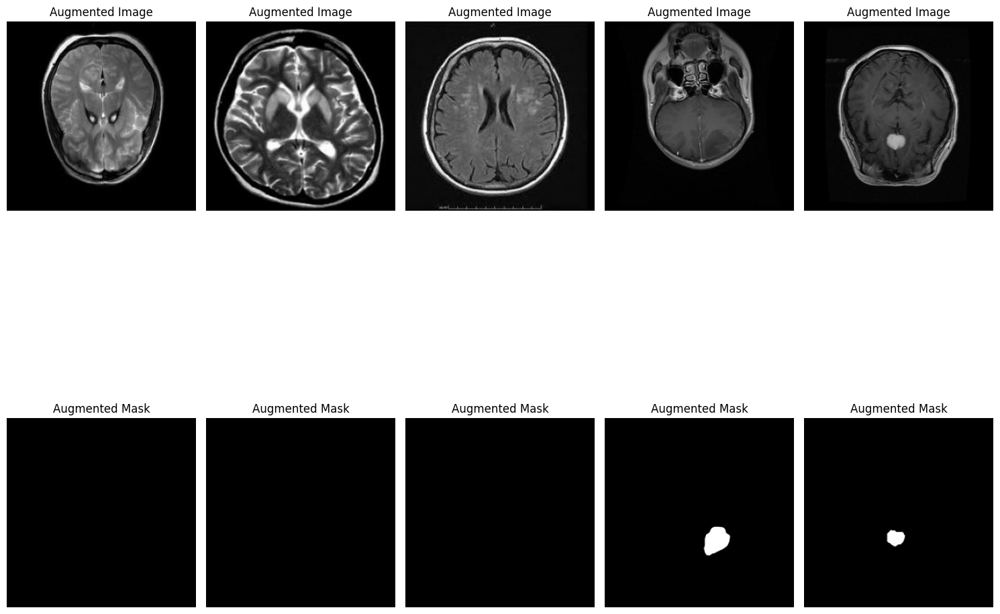

In [14]:
def display_augmented_samples(dataset, num_samples=5):
    for images, masks in dataset.take(1):
        plt.figure(figsize=(15, num_samples * 3))
        for i in range(num_samples):
            plt.subplot(2, num_samples, i+1)
            plt.imshow(images[i])
            plt.axis("off")
            plt.title("Augmented Image")

            plt.subplot(2, num_samples, num_samples + i + 1)
            plt.imshow(tf.squeeze(masks[i]), cmap="gray")
            plt.axis("off")
            plt.title("Augmented Mask")
        plt.tight_layout()
        plt.show()

# Display from train_ds
display_augmented_samples(train_ds)


In [15]:
def check_file_exists(img_path, mask_path):
    return tf.io.gfile.exists(img_path) and tf.io.gfile.exists(mask_path)

# Filtered list
valid_image_paths = []
valid_mask_paths = []

for img_path, mask_path in zip(image_paths, mask_paths):
    if os.path.exists(img_path) and os.path.exists(mask_path):
        valid_image_paths.append(img_path)
        valid_mask_paths.append(mask_path)

print(f"Valid Pairs Found: {len(valid_image_paths)}")


Valid Pairs Found: 4237


In [16]:
for images, masks in train_ds.take(1):
    print("Image shape:", images[0].shape)
    print("Mask shape:", masks[0].shape)
    break


Image shape: (256, 256, 3)
Mask shape: (256, 256, 1)


In [17]:
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice

def iou_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    total = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    union = total - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou


In [18]:
def conv_block(inputs, num_filters):
    x = layers.Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = layers.MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = layers.concatenate([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape=(256, 256, 3)):
    inputs = layers.Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bridge
    b1 = conv_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(d4)

    model = models.Model(inputs, outputs, name="U-Net")
    return model


In [19]:
model = build_unet()

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=BinaryCrossentropy(),
    metrics=[dice_coefficient, iou_coefficient]
)


In [20]:
model.summary()


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 128, 128, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ re_lu_3[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [42]:
from tensorflow.keras.utils import plot_model

# Plot and save the model architecture to a file
plot_model(model, to_file="unet_architecture.png", show_shapes=True, show_layer_names=True)


In [21]:
callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint("U-net_model.keras", monitor="val_loss", save_best_only=True, verbose=1)
]


In [22]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=callbacks
)


Epoch 1/50
424/424 ━━━━━━━━━━━━━━━━━━━━ 0s 684ms/step - dice_coefficient: 0.0185 - iou_coefficient: 0.0097 - loss: 0.2418
Epoch 1: val_loss improved from inf to 0.09401, saving model to U-net_model.keras
424/424 ━━━━━━━━━━━━━━━━━━━━ 380s 716ms/step - dice_coefficient: 0.0185 - iou_coefficient: 0.0097 - loss: 0.2416 - val_dice_coefficient: 0.0011 - val_iou_coefficient: 5.5979e-04 - val_loss: 0.0940 - learning_rate: 1.0000e-04
Epoch 2/50
424/424 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - dice_coefficient: 0.1505 - iou_coefficient: 0.0976 - loss: 0.0763
Epoch 2: val_loss improved from 0.09401 to 0.04885, saving model to U-net_model.keras
424/424 ━━━━━━━━━━━━━━━━━━━━ 252s 594ms/step - dice_coefficient: 0.1509 - iou_coefficient: 0.0979 - loss: 0.0763 - val_dice_coefficient: 0.5275 - val_iou_coefficient: 0.3817 - val_loss: 0.0488 - learning_rate: 1.0000e-04
Epoch 3/50
424/424 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - dice_coefficient: 0.5810 - iou_coefficient: 0.4316 - loss: 0.0488
Epoch 3: val_loss im

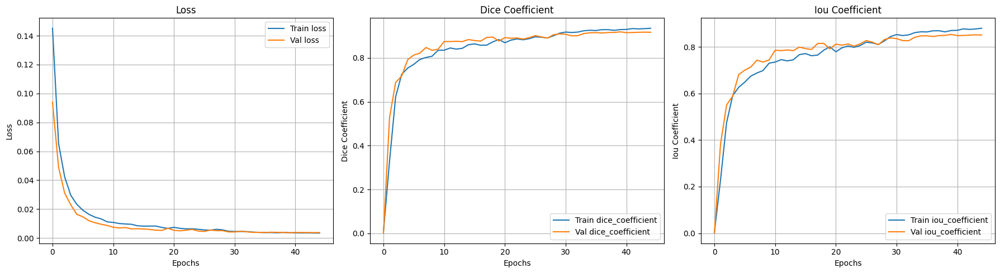

In [23]:
def plot_metrics(history):
    metrics = ['loss', 'dice_coefficient', 'iou_coefficient']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label=f"Train {metric}")
        plt.plot(history.history[f"val_{metric}"], label=f"Val {metric}")
        plt.title(metric.replace("_", " ").title())
        plt.xlabel("Epochs")
        plt.ylabel(metric.replace("_", " ").title())
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show() 

# Call the function
plot_metrics(history)


In [24]:
# Evaluate the model on the test set
test_loss, test_dice, test_iou = model.evaluate(test_ds)

print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Dice Coefficient: {test_dice:.4f}")
print(f"Test IoU: {test_iou:.4f}")


53/53 ━━━━━━━━━━━━━━━━━━━━ 10s 187ms/step - dice_coefficient: 0.9084 - iou_coefficient: 0.8368 - loss: 0.0046

Test Loss: 0.0040
Test Dice Coefficient: 0.9167
Test IoU: 0.8505


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

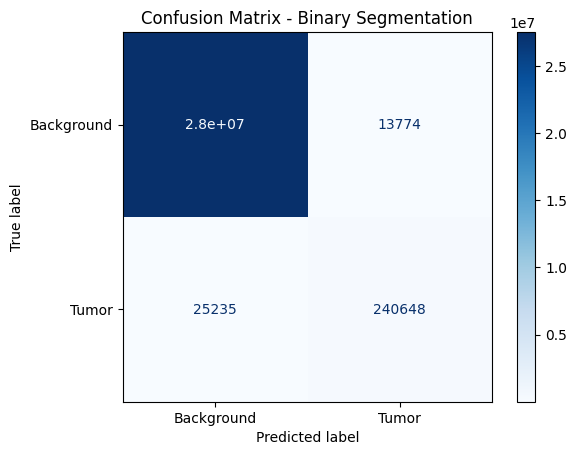

Confusion Matrix:
 [[27507607    13774]
 [   25235   240648]]


In [26]:
# Flattened lists for all test masks and predictions
all_true = []
all_pred = []

for images, masks in test_ds:
    preds = model.predict(images)
    
    # Threshold predictions to get binary masks (0 or 1)
    preds_bin = (preds > 0.5).astype(np.uint8)
    
    # Binarize the ground truth masks
    masks_bin = (masks > 0.5).numpy().astype(np.uint8)
    
    # Flatten and collect
    all_true.extend(masks_bin.flatten())
    all_pred.extend(preds_bin.flatten())

# Compute confusion matrix
cm = confusion_matrix(all_true, all_pred)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Background", "Tumor"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Binary Segmentation")
plt.show()

print("Confusion Matrix:\n", cm)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


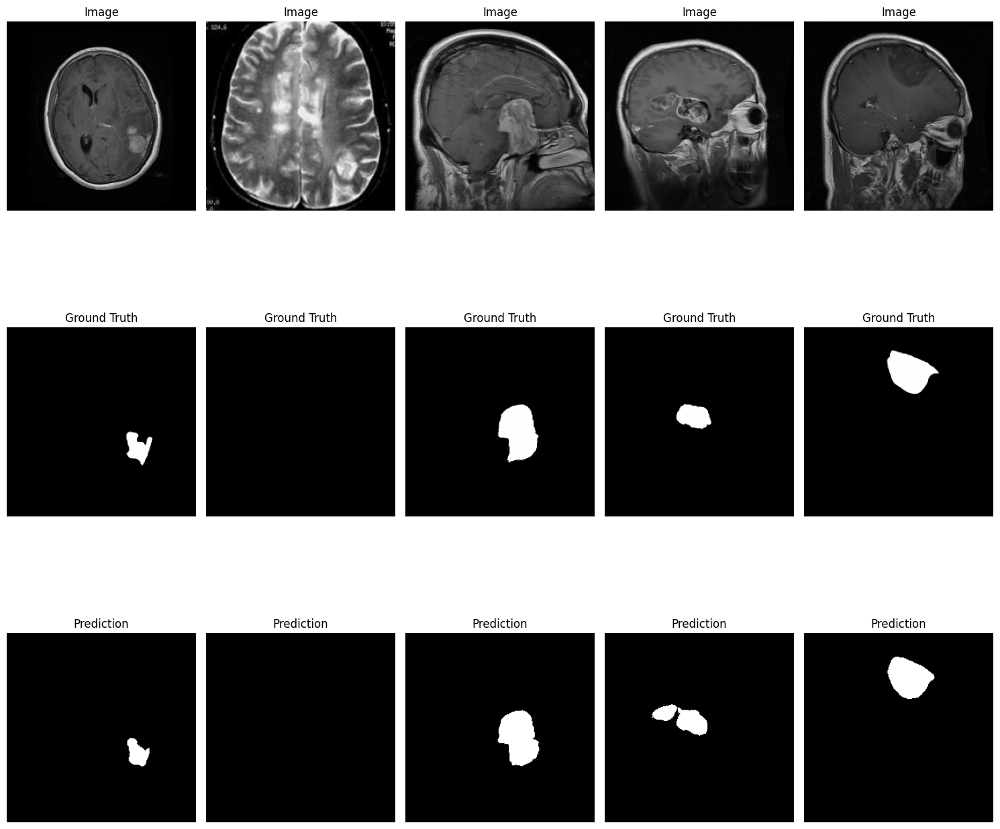

In [27]:
def visualize_predictions(dataset, model, num_samples=5):
    for images, masks in dataset.take(1):
        preds = model.predict(images)
        preds = (preds > 0.5).astype(np.uint8)

        plt.figure(figsize=(15, num_samples * 3))
        for i in range(num_samples):
            # Original image
            plt.subplot(3, num_samples, i + 1)
            plt.imshow(images[i])
            plt.axis("off")
            plt.title("Image")

            # Ground truth mask
            plt.subplot(3, num_samples, num_samples + i + 1)
            plt.imshow(tf.squeeze(masks[i]), cmap="gray")
            plt.axis("off")
            plt.title("Ground Truth")

            # Predicted mask
            plt.subplot(3, num_samples, 2 * num_samples + i + 1)
            plt.imshow(tf.squeeze(preds[i]), cmap="gray")
            plt.axis("off")
            plt.title("Prediction")

        plt.tight_layout()
        plt.show()

# Run the visualization
visualize_predictions(test_ds, model)


In [28]:
import matplotlib.pyplot as plt

def visualize_prediction(image, ground_truth_mask, predicted_mask, threshold=0.5):
    # Convert tensors to NumPy arrays
    image = image.numpy()
    gt_mask = ground_truth_mask.numpy().squeeze()
    pred_mask = predicted_mask.numpy().squeeze()

    # Threshold prediction
    pred_mask_bin = (pred_mask > threshold).astype(np.uint8)

    plt.figure(figsize=(18, 6))

    # Original Image
    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    # Ground Truth Mask
    plt.subplot(1, 4, 2)
    plt.imshow(image)
    plt.imshow(gt_mask, cmap='Reds', alpha=0.5)
    plt.title("Ground Truth Overlay")
    plt.axis("off")

    # Predicted Mask
    plt.subplot(1, 4, 3)
    plt.imshow(image)
    plt.imshow(pred_mask_bin, cmap='Greens', alpha=0.5)
    plt.title("Predicted Overlay")
    plt.axis("off")

    # Combined Overlay
    plt.subplot(1, 4, 4)
    plt.imshow(image)
    plt.imshow(gt_mask, cmap='Greens', alpha=0.4)
    plt.imshow(pred_mask_bin, cmap='Reds', alpha=0.4)
    plt.title("Ground Truth vs Prediction")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [29]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess custom image
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = image / 255.0  # normalize
    return image


In [30]:
def predict_custom_image(model, image_path):
    image = load_and_preprocess_image(image_path)
    input_tensor = tf.expand_dims(image, axis=0)  # add batch dimension
    predicted_mask = model.predict(input_tensor)[0]  # remove batch dimension
    return image, predicted_mask


In [31]:
def show_image_with_prediction(image, predicted_mask, threshold=0.5):
    pred_mask_bin = (predicted_mask > threshold).astype(np.uint8).squeeze()

    plt.figure(figsize=(12, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    # Predicted Mask Overlay
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(pred_mask_bin, cmap='Reds', alpha=0.5)
    plt.title("Predicted Mask Overlay")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


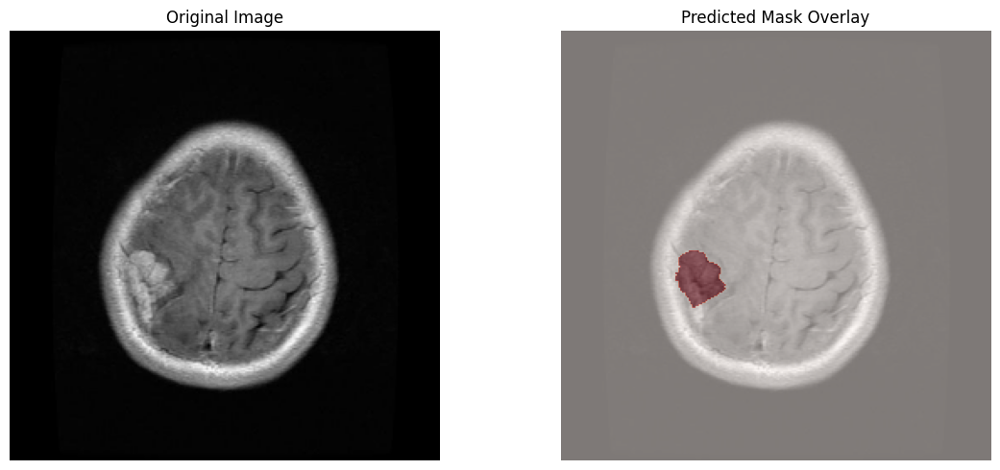

In [32]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/2/Tr-me_0012.jpg"  # <-- Replace this
image, predicted_mask = predict_custom_image(model, image_path)
show_image_with_prediction(image, predicted_mask)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


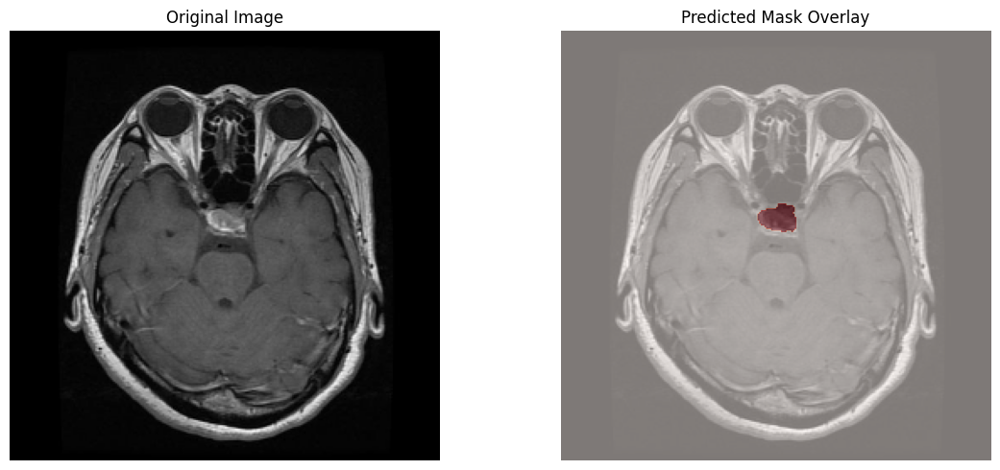

In [33]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/3/Tr-piTr_0000.jpg"  # <-- Replace this
image, predicted_mask = predict_custom_image(model, image_path)
show_image_with_prediction(image, predicted_mask)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


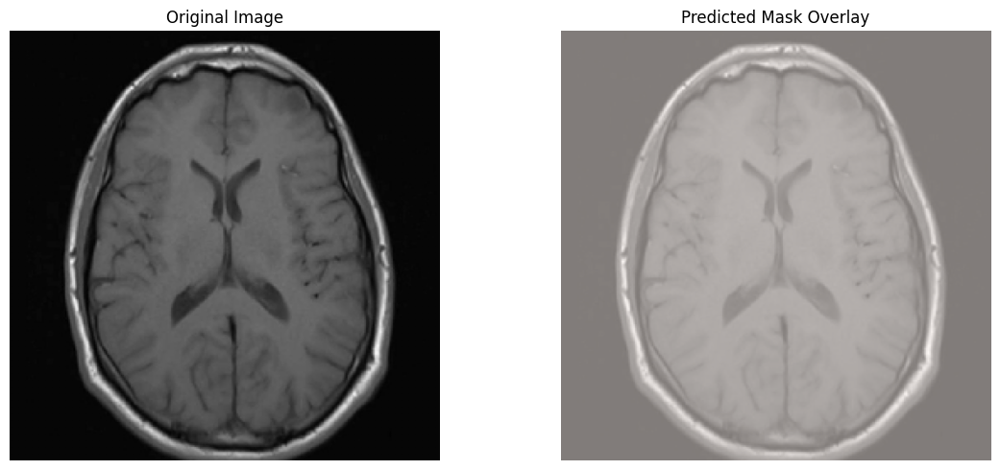

In [34]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/0/Tr-noTr_0002.jpg"  # <-- Replace this
image, predicted_mask = predict_custom_image(model, image_path)
show_image_with_prediction(image, predicted_mask)

In [35]:
def load_custom_image(image_path, target_size=(256, 256)):
    image = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = image / 255.0
    return image


In [36]:
def predict_binary_mask(model, image):
    input_tensor = tf.expand_dims(image, axis=0)
    prediction = model.predict(input_tensor)[0]  # (512, 512, 1)
    predicted_mask = (prediction > 0.5).astype(np.uint8).squeeze()
    return predicted_mask


In [37]:
def overlay_binary_mask(image, mask, color=[0, 255, 0]):
    image = (image * 255).astype(np.uint8)
    overlay = image.copy()
    
    # Apply color mask
    overlay[mask == 1] = color

    # Blend original + overlay
    blended = (0.7 * image + 0.3 * overlay).astype(np.uint8)

    # Plot
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(blended)
    plt.title("Image with Predicted Tumor Mask")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


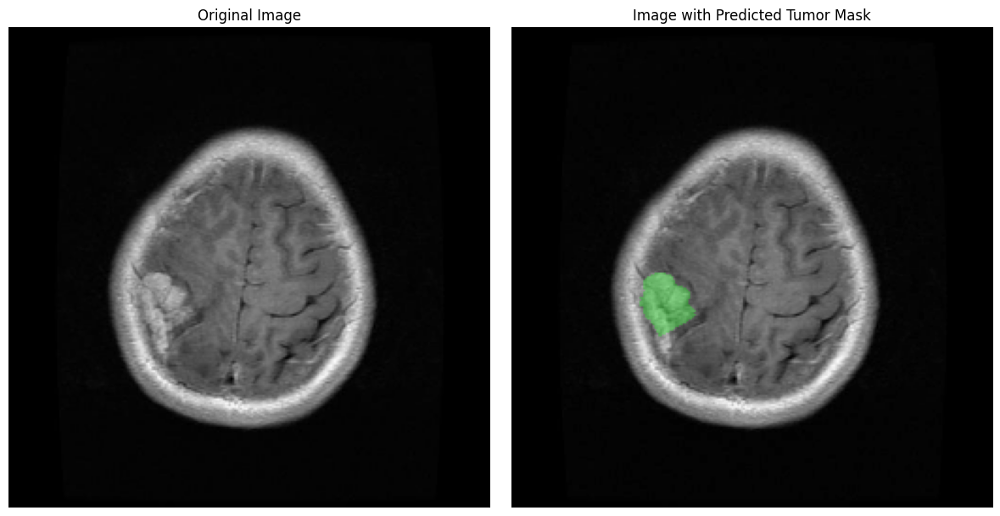

In [38]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/2/Tr-me_0012.jpg"

image = load_custom_image(image_path)
predicted_mask = predict_binary_mask(model, image)
overlay_binary_mask(image, predicted_mask)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


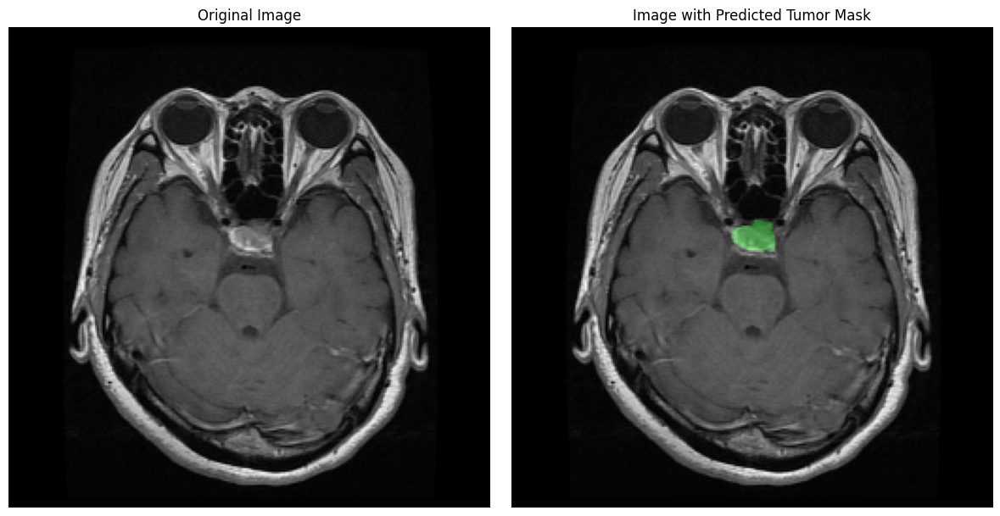

In [39]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/3/Tr-piTr_0000.jpg"

image = load_custom_image(image_path)
predicted_mask = predict_binary_mask(model, image)
overlay_binary_mask(image, predicted_mask)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


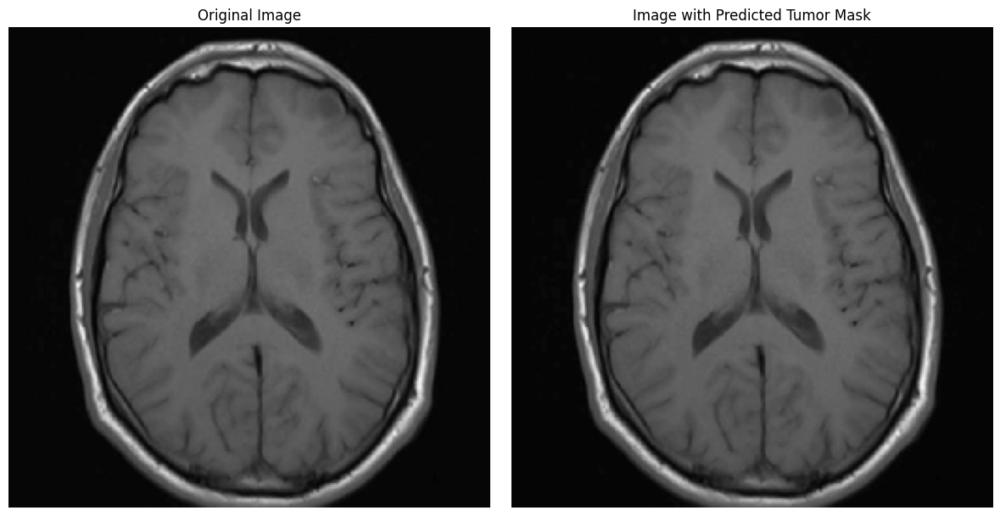

In [40]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/0/Tr-noTr_0002.jpg"

image = load_custom_image(image_path)
predicted_mask = predict_binary_mask(model, image)
overlay_binary_mask(image, predicted_mask)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


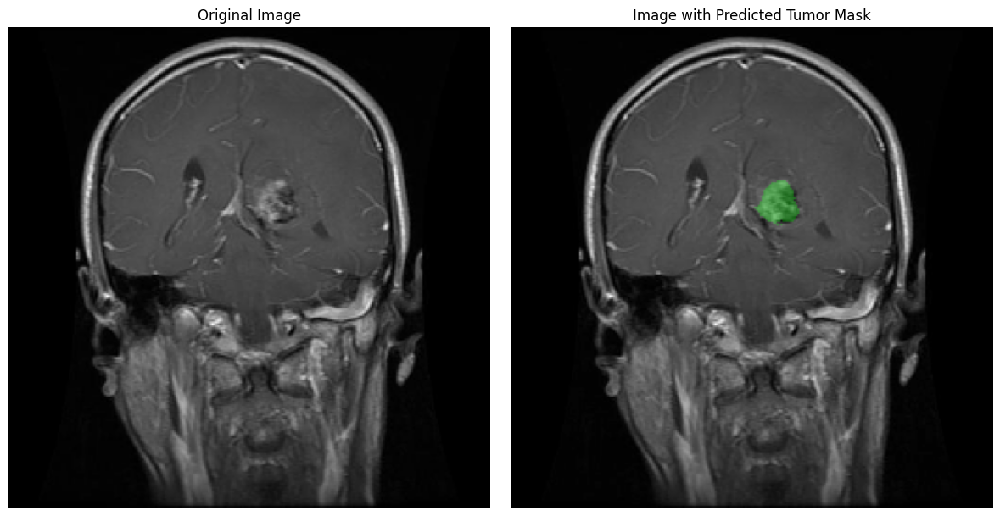

In [41]:
image_path = "/kaggle/input/brain-tumor-segmentation/Brain Tumor Segmentation Dataset/image/1/Tr-glTr_0007.jpg"

image = load_custom_image(image_path)
predicted_mask = predict_binary_mask(model, image)
overlay_binary_mask(image, predicted_mask)

In [51]:
def visualize_prediction(image, ground_truth_mask, predicted_mask, threshold=0.5):
    image = np.array(image)
    gt_mask = np.squeeze(np.array(ground_truth_mask))
    pred_mask = np.squeeze(np.array(predicted_mask))

    # Threshold prediction
    pred_mask_bin = (pred_mask > threshold).astype(np.uint8)

    # Ensure image is 3-channel RGB and scaled
    if image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)
    if image.shape[-1] == 1:
        image = np.concatenate([image] * 3, axis=-1)

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(image)
    plt.imshow(gt_mask, cmap='Greens', alpha=0.5)
    plt.title("Ground Truth Overlay")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(image)
    plt.imshow(pred_mask_bin, cmap='Reds', alpha=0.5)
    plt.title("Predicted Overlay")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(image)
    plt.imshow(gt_mask, cmap='Greens', alpha=0.4)
    plt.imshow(pred_mask_bin, cmap='Reds', alpha=0.4)
    plt.title("Ground Truth vs Prediction")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


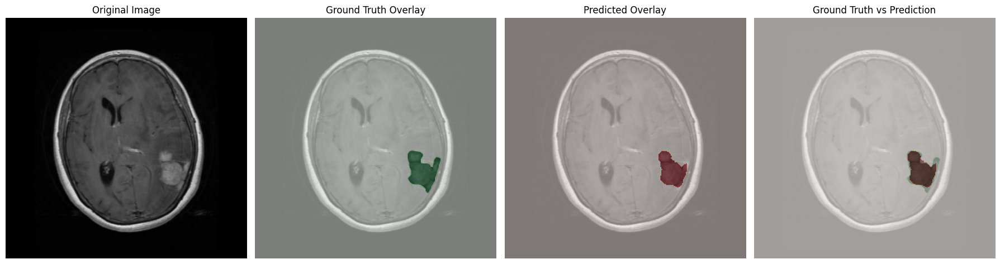

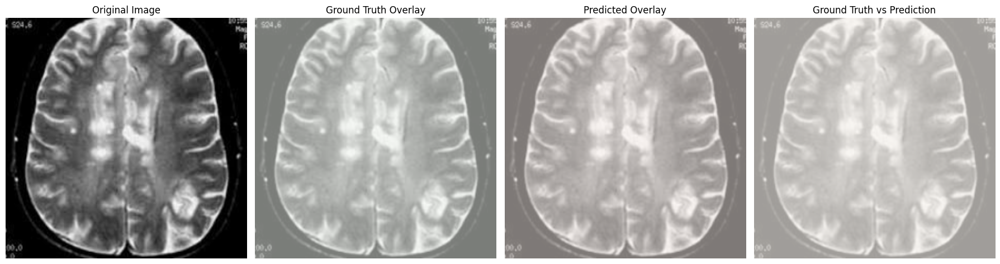

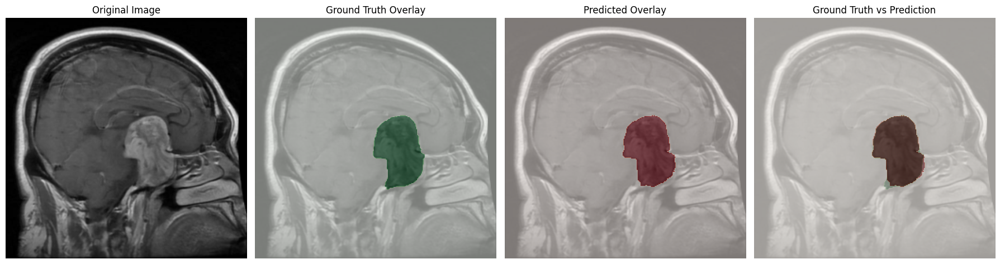

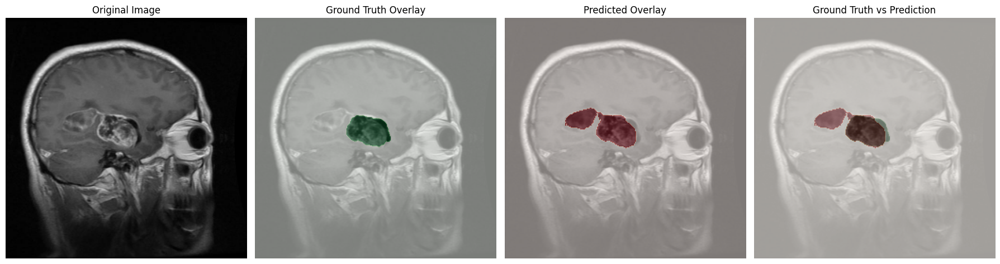

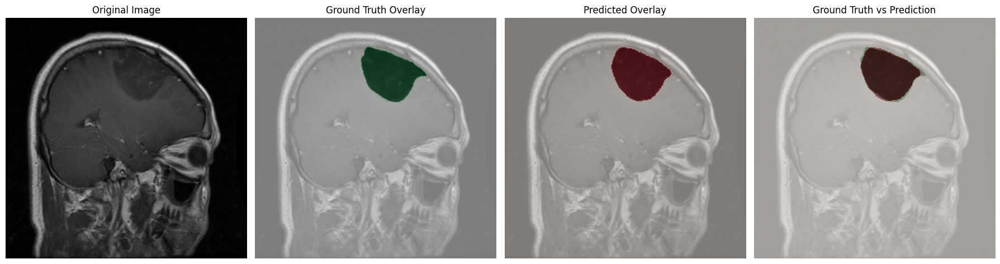

In [52]:
# Display predictions on a few test samples
for images, masks in test_ds.take(1):
    preds = model.predict(images)
    for i in range(5):  # show 5 samples
        visualize_prediction(images[i], masks[i], preds[i])
